# EXPLORATORY DATA ANALYSIS

### Objectives

*   Visualize distribution of buildings for each state.
*   Determine if there is a difference between commercial and non commercial buildings and their indoor temperature.
*   Determine if the average indoor temperature is the same for each residential building located in New York State.
*   Select a building for single building EDA.
        - Plot pandas data frame.
        - Create heatmap to see the correlation between the columns.
        - Check how indoor temperature is changing over the time.
        - Check temperature difference fluctuations over the time.
        - Visualize how boiler setting is changing regarding outdoor temperature.
        - Visualize how boiler setting is changing regarding indoor temperature.
        - Visualize indoor temperature vs outdoor temperature.
        - Compare indoor temperatures of two different days and analyse outdoor temperature's role.
*   Check the dataset for stationarity, trends, and seasonality.

## IMPORT DATA

In [5]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import plotly.express as px

pd.set_option('display.max_columns',0)
sns.set_style('darkgrid') 
# font = {'weight' : 'bold', 'size' : 23}
# matplotlib.rc('font', **font)
plt.style.use('seaborn')
sns.set(rc={'figure.figsize':(10, 7)});

import statistics 

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from  statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from pandas.plotting import autocorrelation_plot

import warnings
warnings.filterwarnings('ignore')

In [7]:
df = pd.read_csv('/content/thermostat_data_cleaned.csv').drop('Unnamed: 0', axis=1)
df.head()

,building_id,ts,outdoor_temp,boiler_on,commercial,state,indoor_temp,temp_diff
0,6294,2020-11-17 20:24:00,46.748,0.0,0,NY,76.6015,29.8535
1,6294,2020-11-17 20:25:00,46.798,0.0,0,NY,76.6015,29.8035
2,6294,2020-11-17 20:26:00,46.810,0.0,0,NY,76.6015,29.7915
3,6294,2020-11-17 20:27:00,46.636,0.0,0,NY,76.6015,29.9655
4,6294,2020-11-17 20:28:00,46.224,0.0,0,NY,76.6015,30.3775


In [8]:
df['ts'] = pd.to_datetime(df['ts'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3524915 entries, 0 to 3524914
Data columns (total 8 columns):
 #   Column        Dtype         
---  ------        -----         
 0   building_id   int64         
 1   ts            datetime64[ns]
 2   outdoor_temp  float64       
 3   boiler_on     float64       
 4   commercial    int64         
 5   state         object        
 6   indoor_temp   float64       
 7   temp_diff     float64       
dtypes: datetime64[ns](1), float64(4), int64(2), object(1)
memory usage: 215.1+ MB


In [9]:
df['building_id'] = df['building_id'].astype('object')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3524915 entries, 0 to 3524914
Data columns (total 8 columns):
 #   Column        Dtype         
---  ------        -----         
 0   building_id   object        
 1   ts            datetime64[ns]
 2   outdoor_temp  float64       
 3   boiler_on     float64       
 4   commercial    int64         
 5   state         object        
 6   indoor_temp   float64       
 7   temp_diff     float64       
dtypes: datetime64[ns](1), float64(4), int64(1), object(2)
memory usage: 215.1+ MB


-----------------------------------------------------------------------------------------------

## OBJECTIVE 1

***Distribution of buildings in each state and statistical analysis for each state.***

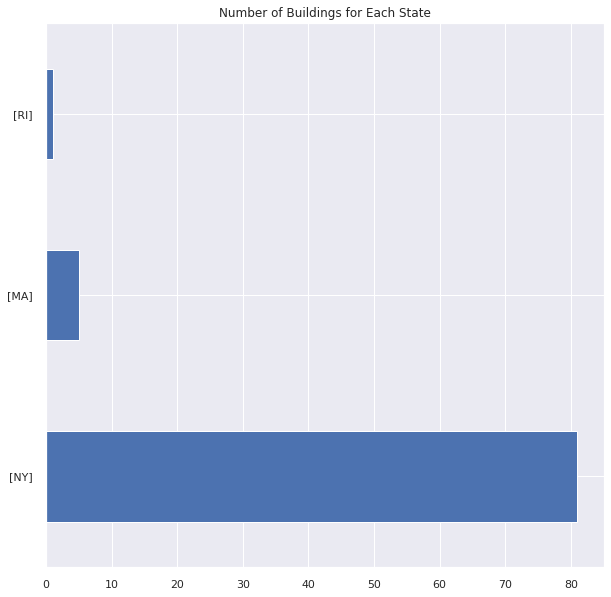

In [10]:
df.groupby('building_id')['state'].unique().value_counts().plot(kind='barh', 
                                                                figsize=(10,10), 
                                                                title='Number of Buildings for Each State');

In [11]:
# Statistical analysis for each state.
round(df.drop('building_id', axis=1).groupby(['state']).describe().T, 3)

state                       MA           NY         RI
outdoor_temp count  209550.000  3273375.000  41990.000
             mean       44.099       47.781     40.539
             std         9.979       18.723      9.896
             min        19.904     -148.288     20.322
             25%        36.072       40.228     32.614
             50%        44.082       48.172     39.991
             75%        50.647       55.743     47.538
             max        86.183      123.358     62.366
boiler_on    count  209550.000  3273375.000  41990.000
             mean        0.195        0.259      1.000
             std         0.396        0.438      0.000
             min         0.000        0.000      1.000
             25%         0.000        0.000      1.000
             50%         0.000        0.000      1.000
             75%         0.000        1.000      1.000
             max         1.000        1.000      1.000
commercial   count  209550.000  3273375.000  41990.000
             mean        0.000        0.038      0.000
             std         0.000        0.192      0.000
             min         0.000        0.000      0.000
             25%         0.000        0.000      0.000
             50%         0.000        0.000      0.000
             75%         0.000        0.000      0.000
             max         0.000        1.000      0.000
indoor_temp  count  209550.000  3273375.000  41990.000
             mean       72.695       72.868     75.618
             std         2.171        2.694      0.938
             min        66.425       55.062     72.860
             25%        70.920       71.375     74.930
             50%        72.950       72.837     75.560
             75%        74.352       74.300     76.280
             max        81.716       87.012     79.250
temp_diff    count  209550.000  3273375.000  41990.000
             mean       28.596       25.087     35.079
             std        10.197       18.766      9.202
             min       -16.495      -49.238     14.004
             25%        21.779       16.936     28.350
             50%        28.785       24.662     35.816
             75%        36.507       32.477     42.366
             max        55.953      218.538     54.407

### Observations



* The majority of buildings are in New York State. Out of 87, 5 of them are in Massachusetts, and only 1 in Rhode Island.

* Between November 17,2020 and December 17,2020, New York has the highest average outdoor temperature with 47.78 °F while Rhode Island has the lowest average outdoor temperature with 40.53 °F.

* Due to front fill method used in data cleaning step, for the building in Rhode Island, all the boiler on column is 1. When we further investigate, in the initial dataset, this columns was full null, therefore this information is not accurate. We drop this building from our dataset.

* The commercial buildings are located in NY.

* The average indoor temperature is similar for MA and NY. RI has higher indoor temperature.

* Average indoor and outdoor temperature difference seems significantly different for each state. 

* Statistical summary of temperature difference column indicates some outdoor temperature is higher that indoor temperature. We created this column as below:

$$ \text{Temperature Difference} = \text{Indoor Temperature − Outdoor Temperature}$$

In [12]:
# The building in RI does not provide boiler on/off information. 
# Drop this building from dataset.
indicies = list(df[df['state'] =='RI'].index)
df.drop(index = indicies, inplace=True)
df[df['state'] == 'RI']

,building_id,ts,outdoor_temp,boiler_on,commercial,state,indoor_temp,temp_diff


-----------------------------------------------------------------------------------------------



## OBJECTIVE 2

***Is there a difference between commercial and non commercial buildings and their indoor temperature?***

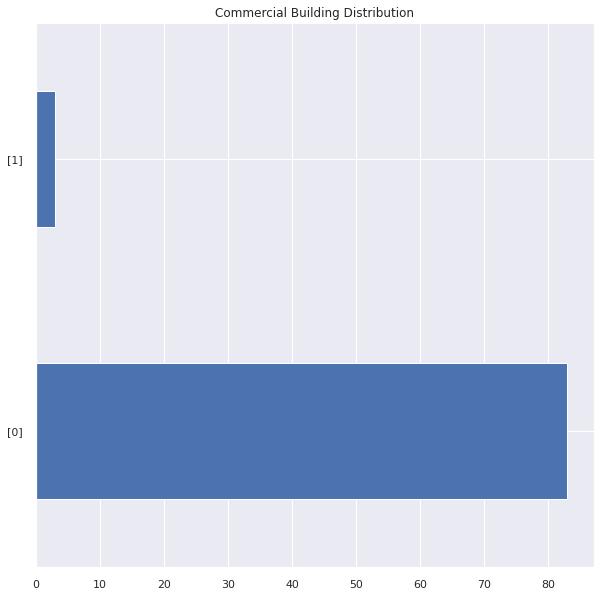

In [13]:
df.groupby('building_id')['commercial'].unique().value_counts().plot(kind='barh', 
                                                                figsize=(10,10), 
                                                                title='Commercial Building Distribution');

We observe that majority of the buildings the company have smart heaters are non-commercial, residential buildings. Let's see if there is significant difference between commercial and non commercial buildings' indoor temperature.

In [17]:
# sns.catplot(x='building_id', y='indoor_temp', col='commercial', data=df);

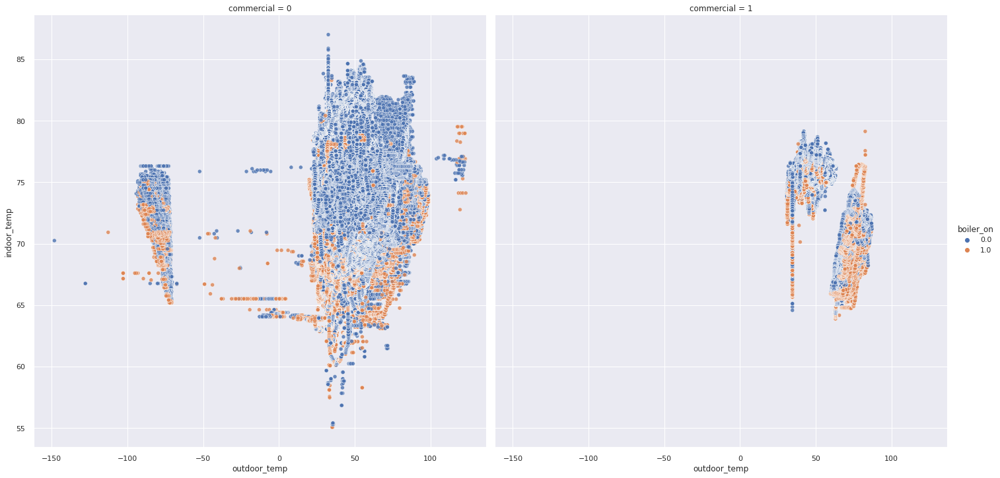

In [16]:
sns.relplot(x='outdoor_temp', 
            y='indoor_temp', 
            hue='boiler_on', 
            col='commercial', 
            data=df,                 
            alpha=0.8, 
            height=10);

In [18]:
# Statistical summary for commercial and non commercial buildings.
round(df.drop('building_id', axis=1).groupby(['state', 'commercial']).describe().T, 3)

state                       MA           NY            
commercial                   0            0           1
outdoor_temp count  209550.000  3147434.000  125941.000
             mean       44.099       47.613      51.982
             std         9.979       18.768      17.017
             min        19.904     -148.288      30.884
             25%        36.072       40.436      34.581
             50%        44.082       48.172      47.917
             75%        50.647       55.548      69.918
             max        86.183      123.358      87.101
boiler_on    count  209550.000  3147434.000  125941.000
             mean        0.195        0.262       0.174
             std         0.396        0.440       0.379
             min         0.000        0.000       0.000
             25%         0.000        0.000       0.000
             50%         0.000        0.000       0.000
             75%         0.000        1.000       0.000
             max         1.000        1.000       1.000
indoor_temp  count  209550.000  3147434.000  125941.000
             mean       72.695       72.905      71.942
             std         2.171        2.660       3.314
             min        66.425       55.062      63.894
             25%        70.920       71.431      69.238
             50%        72.950       72.860      71.330
             75%        74.352       74.300      75.087
             max        81.716       87.012      79.137
temp_diff    count  209550.000  3147434.000  125941.000
             mean       28.596       25.292      19.960
             std        10.197       18.758      18.224
             min       -16.495      -49.238     -16.400
             25%        21.779       17.087      -0.953
             50%        28.785       24.612      27.548
             75%        36.507       32.220      35.759
             max        55.953      218.538      44.332

### Observations



* Out of 86 buildings, only 3 of them are commercial and they all are located in NY.

* Commercial buildings are located where the average outdoor temperature is higher.

* For residential buildings, boiler kept on longer, given the 1 is in the 3rd quartile. (For commercial buildings, it is out of 3rd quartile.)

* Indoor temperature for residential buildings are higher. It is still within the 1st standard deviation of the commercial buildings' indoor temperature.

* Commercial and non-commercial buildings have their differences. We keep forward our analysis with residential buildings.

* For non-commercial buildings, we observe differences for MA and NY. We can drop the buildings in MA for further analysis.

* We drop *state* and *commercial* columns since they have the same value for each datapoint.

In [19]:
# Drop the commercial dataset for modeling.
indicies = list(df[df['commercial'] == 1].index)
df.drop(index = indicies, inplace=True)
df[df['commercial'] == 1]

,building_id,ts,outdoor_temp,boiler_on,commercial,state,indoor_temp,temp_diff


In [20]:
# Drop the buildings in MA.
indicies = list(df[df['state'] =='MA'].index)
df.drop(index = indicies, inplace=True)
df[df['state'] == 'MA']

,building_id,ts,outdoor_temp,boiler_on,commercial,state,indoor_temp,temp_diff


In [21]:
df.drop(['state', 'commercial'], axis=1, inplace=True)

-----------------------------------------------------------------------------------------------

## OBJECTIVE 3

***Is the average indoor temperature same for each residential building located in New York State?***

In [22]:
temp_df = pd.DataFrame(df.groupby('building_id')['indoor_temp'].mean())
temp_df = temp_df.reset_index()
temp_df['building_id'] = temp_df['building_id'].astype('object')
temp_df.head()

,building_id,indoor_temp
0,6294,75.462157
1,6492,73.420306
2,6537,74.041569
3,6603,71.694036
4,6669,70.452426


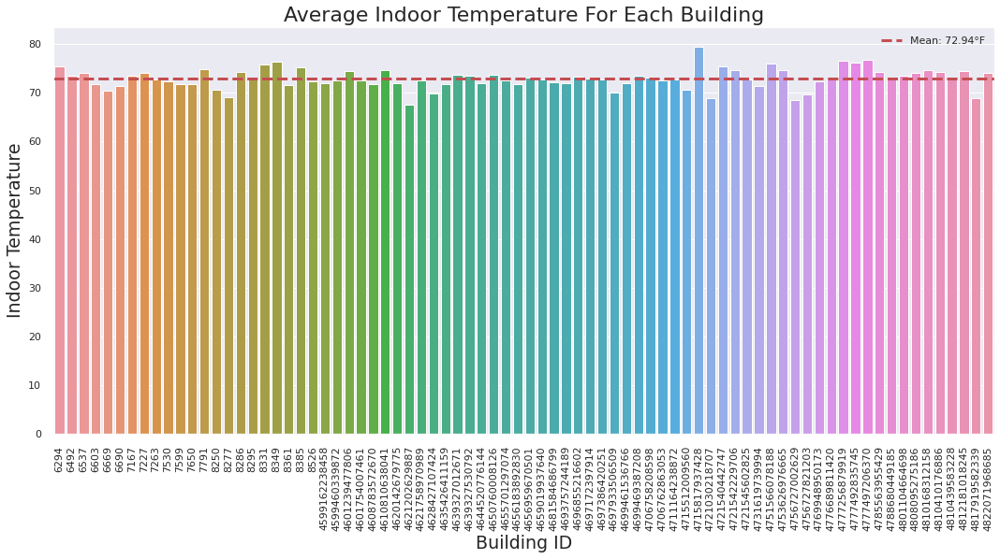

In [23]:
# Calculate the mean indoor temperature for all the buildings.
mean = round(temp_df['indoor_temp'].mean(),2)

# Plot average indoor temperature for each building with mean value to compare.
plt.figure(figsize=(18,8))
sns.barplot(x='building_id', y='indoor_temp', data=temp_df)
plt.title('Average Indoor Temperature For Each Building', fontsize=22)
plt.axhline(mean, color ='r', label='Mean: '+str(mean)+'°F', linewidth=3, linestyle='--')
plt.xlabel('Building ID', fontsize=19)
plt.ylabel('Indoor Temperature', fontsize=19)
plt.xticks(rotation='vertical')
plt.legend()
plt.show();

In [24]:
round(df.groupby('building_id')['indoor_temp'].describe().T, 3)

building_id,6294,6492,6537,6603,6669,6690,7167,7227,7263,7530,7599,7650,7791,8250,8277,8286,8295,8331,8349,8361,8385,8526,4599162238458,4599460339872,4601239477806,4601754007461,4608783572670,4610810638041,4620142679775,4621202629887,4621758970989,4628427107424,4635426411159,4639327012671,4639327530792,4644520776144,4650760008126,4655701297074,4656183892830,4656959670501,4659019937640,4681584686799,4693757244189,4696855216602,4697172397914,4697386420251,4697933506509,4699461536766,4699469387208,4706758208598,4706762863053,4711164238872,4715512009560,4715817937428,4721030218707,4721540442747,4721542229706,4721545602825,4731619739994,4751566078188,4753626976665,4756727002629,4756727821203,4769948950173,4776689811420,4777256879919,4777492835745,4777497206370,4785563955429,4788680449185,4801104664698,4808095275186,4810168312158,4810410176886,4810439583228,4812181018245,4817919582339,4822071968685
count,41980.000,11413.000,41955.000,41990.000,41981.000,41986.000,41984.000,41934.000,41878.000,41991.000,41980.00,41979.00,39940.000,42000.000,41985.000,41993.000,41981.000,41975.000,41984.000,41990.000,41983.000,41990.000,41991.000,31846.000,41945.000,41987.000,41960.000,40502.000,41991.000,41985.000,41998.000,41977.000,41206.000,41986.000,41976.000,41987.000,41991.000,41991.000,41985.000,41949.000,41672.000,38518.000,41983.000,41975.000,41968.000,41977.000,40412.000,42127.000,41389.000,41989.000,41984.000,41985.000,41992.000,38128.000,41617.000,41984.000,41932.000,41981.000,41986.000,41979.000,42024.000,41986.000,41916.000,41991.000,41988.000,41639.000,41988.000,41986.000,41506.000,41988.000,41986.000,41984.000,22985.000,41985.000,41982.000,22862.000,36487.000,14448.000
mean,75.462,73.420,74.042,71.694,70.452,71.404,73.529,74.086,72.660,72.293,71.78,71.78,74.923,70.669,69.054,74.205,72.720,75.810,76.298,71.635,75.320,72.432,71.891,72.574,74.508,72.534,71.718,74.708,71.890,67.622,72.554,69.797,71.767,73.725,73.514,71.977,73.717,72.498,71.805,73.185,72.782,72.229,72.017,73.302,72.864,72.781,70.143,72.002,73.435,73.171,72.484,72.784,70.612,79.487,68.983,75.478,74.579,72.827,71.394,75.926,74.644,68.521,69.616,72.282,72.790,76.630,76.269,76.812,74.368,73.131,73.556,74.038,74.589,74.351,73.207,74.509,68.908,74.035
std,1.339,1.266,2.446,1.137,1.363,0.852,0.788,0.401,2.445,0.910,0.00,0.00,1.568,2.809,4.334,1.900,1.276,0.999,0.664,1.319,1.719,0.860,1.570,2.034,1.045,1.361,1.592,1.673,1.167,1.996,1.884,1.622,1.458,1.281,1.020,1.701,1.242,1.334,2.045,2.892,1.433,1.094,1.065,0.995,2.394,0.917,1.220,0.833,1.361,0.982,0.854,1.072,0.766,1.940,1.735,1.212,1.773,4.589,0.530,1.466,1.988,2.447,1.438,1.304,0.887,4.621,1.781,0.894,0.717,0.615,1.290,0.717,1.453,0.311,0.803,1.980,1.933,1.916
min,70.137,68.540,67.325,68.168,61.587,68.540,64.220,67.190,61.553,69.890,71.78,71.78,66.537,63.725,63.950,67.280,69.080,66.920,71.037,66.920,70.025,70.081,68.000,67.662,71.150,64.737,65.210,70.700,68.562,60.237,68.225,64.400,57.470,68.225,68.562,66.594,70.025,64.456,65.187,65.637,66.740,68.720,62.262,64.962,65.412,68.337,63.320,67.887,70.138,69.176,70.137,69.350,67.100,72.050,64.580,71.375,69.687,55.062,69.125,70.700,65.075,60.125,65.244,64.580,67.100,71.240,65.840,70.880,69.080,70.160,73.130,58.280,69.620,68.000,66.740,66.200,59.180,56.840
25%,74.637,72.680,72.326,70.920,69.350,70.880,72.950,74.120,71.331,71.690,71.78,71.78,73.794,69.064,63.950,72.950,71.780,75.200,75.875,70.790,74.412,71.825,70.812,71.150,73.850,71.768,70.700,73.344,70.925,66.762,71.318,69.116,70.700,73.006,72.781,70.925,72.725,71.600,70.812,71.150,71.780,71.420,71.262,72.612,71.262,72.275,69.440,71.431,72.444,72.500,71.994,72.050,70.081,77.787,67.820,74.637,73.288,69.631,71.037,74.840,72.894,67.096,68.558,71.330,72.320,71.240,75.200,76.280,73.940,72.680,73.130,74.300,73.130,74.300,73.220,73.220,67.820,72.320
50%,75.537,73.400,73.794,71.656,70.587,71.510,73.580,74.120,73.089,72.230,71.78,71.78,74.975,70.916,71.510,74.300,72.680,75.920,76.316,71.870,75.537,72.444,71.712,72.612,74.525,72.556,71.960,74.6

In [25]:
temp_df.describe()

,indoor_temp
count,78.000000
mean,72.938309
std,2.058132
min,67.622205
25%,71.826072
50%,72.787230
75%,74.175608
max,79.486759


In [26]:
(temp_df['indoor_temp'] > mean).sum()

36

### Observations

* Out of 78 non-commercial buildings located in New York State, each building have different average indoor temperature which indicates each building have different boiler on/off settings.

* Average indoor temperature for all the buildings is 72.94 °F, which is in range of optimal room temperature.

* Ideal temperature setting varies for each individual. Biological, environmental, and personal preferences play a big role on ideal temperature selection. 

* If needed for future comparisons and setting choices we can use scientific standard room temperature - 73 °F.

---------------------------------------------------------------------------------------------

## OBJECTIVE 4

***EDA with Single building***

For modeling, we will use a single building first as our pilot model. Let's do some exploratory data analysis with this dataset. We use **'Pilot Building'** as assigned name for future references.

In [27]:
data = df[df['building_id'] == 4599162238458]
data = data.drop('building_id', axis=1)
data = data.reset_index().drop('index', axis=1)
data

,ts,outdoor_temp,boiler_on,indoor_temp,temp_diff
0,2020-11-17 20:24:00,51.998,1.0,73.7375,21.7395
1,2020-11-17 20:25:00,51.895,1.0,73.7375,21.8425
2,2020-11-17 20:26:00,51.792,1.0,73.7375,21.9455
3,2020-11-17 20:27:00,51.331,1.0,73.7375,22.4065
4,2020-11-17 20:28:00,51.343,1.0,73.7375,22.3945
...,...,...,...,...,...
41986,2020-12-17 20:17:00,32.421,0.0,72.3310,39.9100
41987,2020-12-17 20:18:00,32.421,0.0,72.3310,39.9100
41988,2020-12-17 20:19:00,32.308,0.0,72.3310,40.0230
41989,2020-12-17 20:20:00,32.308,0.0,72.3310,40.0230


We observed duplicate indicies during exploratory data analysis. This step should be executed in Data Cleaning Notebook. Check the dataset for duplicate values by taking *ts* column as identifier and drop.

In [28]:
print('There are {} data points in the datarame before the duplicates are dropped.'.format(len(data)))
print('There are {} duplicate rows in the data.'.format(data.duplicated(subset=['ts', 'boiler_on', 'indoor_temp']).sum()))
data.drop_duplicates(subset='ts', inplace=True)
print('There are {} data points left in the datarame after the duplicates are dropped.'.format(len(data)))

There are 41991 data points in the datarame before the duplicates are dropped.
There are 93 duplicate rows in the data.
There are 41898 data points left in the datarame after the duplicates are dropped.


***Plot pandas data frame.***

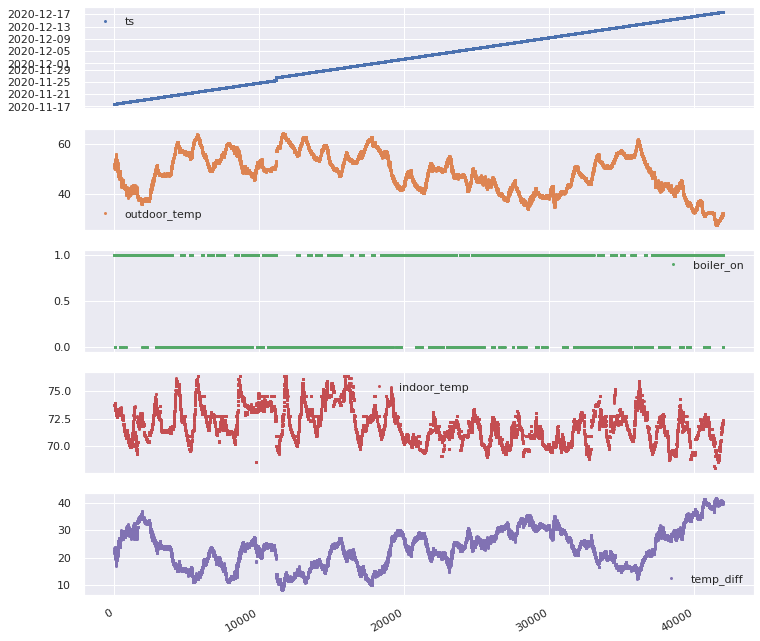

In [29]:
data.plot(subplots=True, figsize=(12,12), style='.');

***Create heatmap to see the correlation between the columns.***


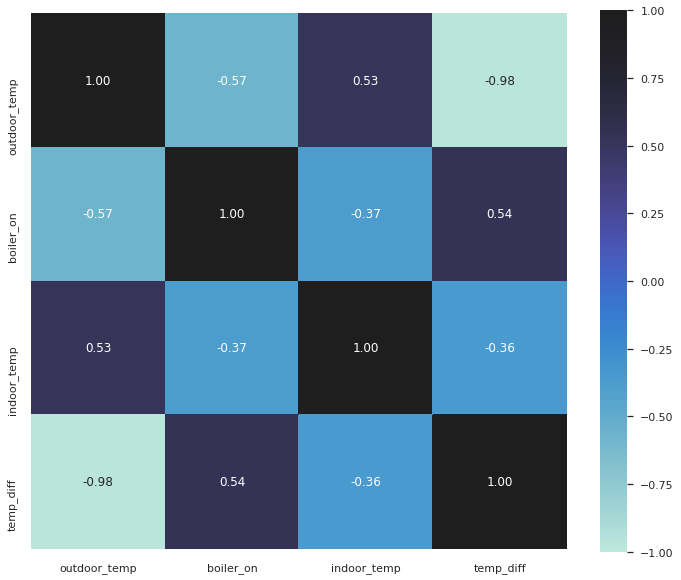

In [31]:
plt.figure(figsize=(12,12))
df_hm = data.drop(['ts'], axis=1)

sns.heatmap(df_hm.corr(), 
            vmax=1.0, 
            vmin=-1.0,                 
            square=True, 
            fmt='.2f',
            annot=True, 
            cbar_kws={'shrink': .83}, 
            center = 1.0, 
            yticklabels=df_hm.columns.values, 
            xticklabels=df_hm.columns.values)
plt.show();

Heatmap shows there is no high correlation between variables except temperature difference column which was engineered by subtracting outdoor temperature from indoor temperature.

* Outdoor temperature has a negative correlation with boiler_on column. (-0.57)
* Indoor temperature also has a negative correlation with boiler_on column. (-0.37)
* Indoor temperature and outdoor temperature has a positie correlation of 0.53.

***Check how indoor temperature is changing over the time.***

Use plotly express to benefit range slider option.

In [32]:
fig = px.line(data, x='ts', y='indoor_temp', 
              # color='boiler_on', line_dash='boiler_on', 
              title='Indoor Temperature Change of Pilot Building For A Month')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

***Check temperature difference fluctuations over the time.***


In [ ]:
fig = px.scatter(data, x='ts', y='temp_diff', 
                 color='boiler_on', 
                 title='Boiler Setting Regarding Temperature Change Change Over the Time')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

***Visualize how boiler setting is changing regarding outdoor temperature.***


In [33]:
fig = px.line(data, x='ts', y='outdoor_temp', 
              color='boiler_on', line_dash='boiler_on', 
              title='Boiler Setting Change Regarding Outdoor Temperature')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

***Visualize how boiler setting is changing regarding indoor temperature.***


In [34]:
fig = px.scatter(data, x='ts', y='indoor_temp', color='boiler_on',
                 title='Boiler Setting Change Regarding Indoor Temperature')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

***Visualize indoor temperature vs outdoor temperature.***


In [35]:
fig = px.scatter(data, x='ts', y='indoor_temp', color='outdoor_temp',
                 title='Indoor Temperature Change Regarding Outdoor Temperature')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

**Compare indoor temperatures of two different days and analyse outdoor temperature's role.**

Convert pandas data frame to time series for future analysis.

In [36]:
# Convert pandas dataframe to time series with minute frequency
ts = data.set_index('ts')
ts.index = pd.to_datetime(ts.index, unit='T')
ts

,outdoor_temp,boiler_on,indoor_temp,temp_diff
ts,,,,
2020-11-17 20:24:00,51.998,1.0,73.7375,21.7395
2020-11-17 20:25:00,51.895,1.0,73.7375,21.8425
2020-11-17 20:26:00,51.792,1.0,73.7375,21.9455
2020-11-17 20:27:00,51.331,1.0,73.7375,22.4065
2020-11-17 20:28:00,51.343,1.0,73.7375,22.3945
...,...,...,...,...
2020-12-17 20:17:00,32.421,0.0,72.3310,39.9100
2020-12-17 20:18:00,32.421,0.0,72.3310,39.9100
2020-12-17 20:19:00,32.308,0.0,72.3310,40.0230


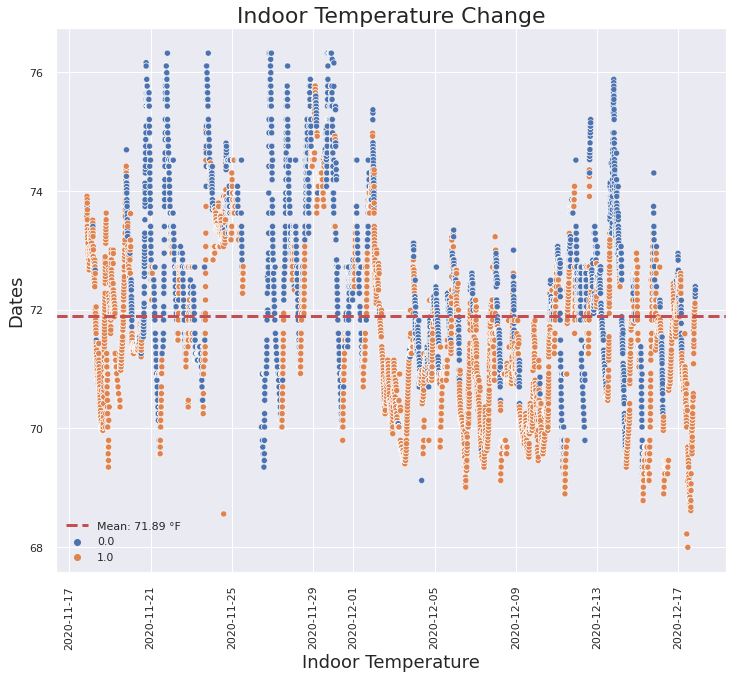

In [37]:
# Visualize indoor temperature change regarding average indoor 
# temperature based on boiler on/off value.

# Get mean value of indoor temperature.
mean = round(ts['indoor_temp'].mean(), 2)
plt.figure(figsize=(12,10))
sns.scatterplot(x = ts.index, y='indoor_temp', hue='boiler_on', data=ts);
plt.title('Indoor Temperature Change', fontsize=22)
plt.axhline(mean, color='r',label= 'Mean: '+str(mean)+' °F', linewidth=3, linestyle='--')
plt.xlabel('Indoor Temperature', fontsize=18)
plt.ylabel('Dates', fontsize=18)
plt.xticks(rotation='vertical')
plt.legend()
plt.show();

In [38]:
import statistics 

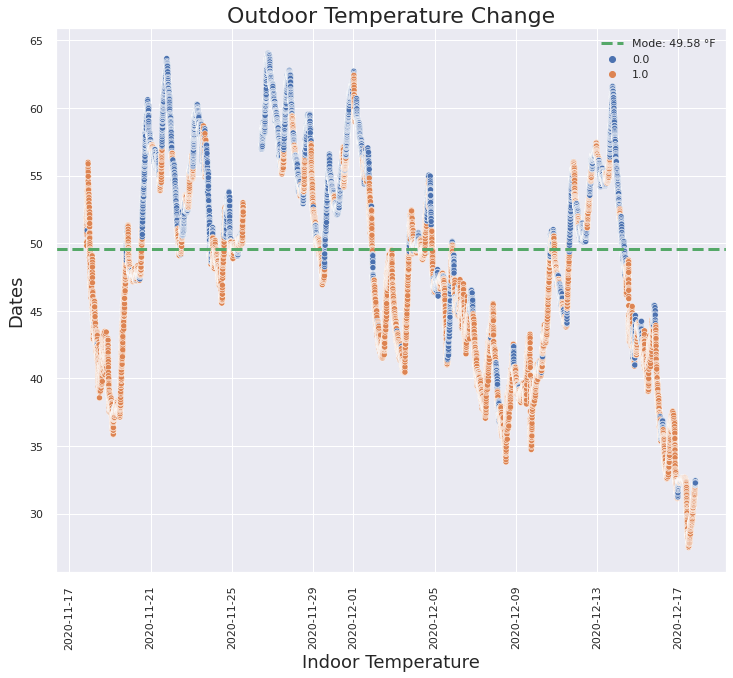

In [39]:
# Visualize how boiler goes on and off regarding outdoor temperature change.
# Get mode of outdoor temperature.
mode = round(statistics.mode(ts['outdoor_temp']), 2)
plt.figure(figsize=(12,10))
sns.scatterplot(x = ts.index, y='outdoor_temp', hue='boiler_on', data=ts);
plt.title('Outdoor Temperature Change', fontsize=22)
plt.axhline(mode, color='g',label= 'Mode: '+str(mode)+' °F', linewidth=3, linestyle='--')
plt.xlabel('Indoor Temperature', fontsize=18)
plt.ylabel('Dates', fontsize=18)
plt.xticks(rotation='vertical')
plt.legend()
plt.show();

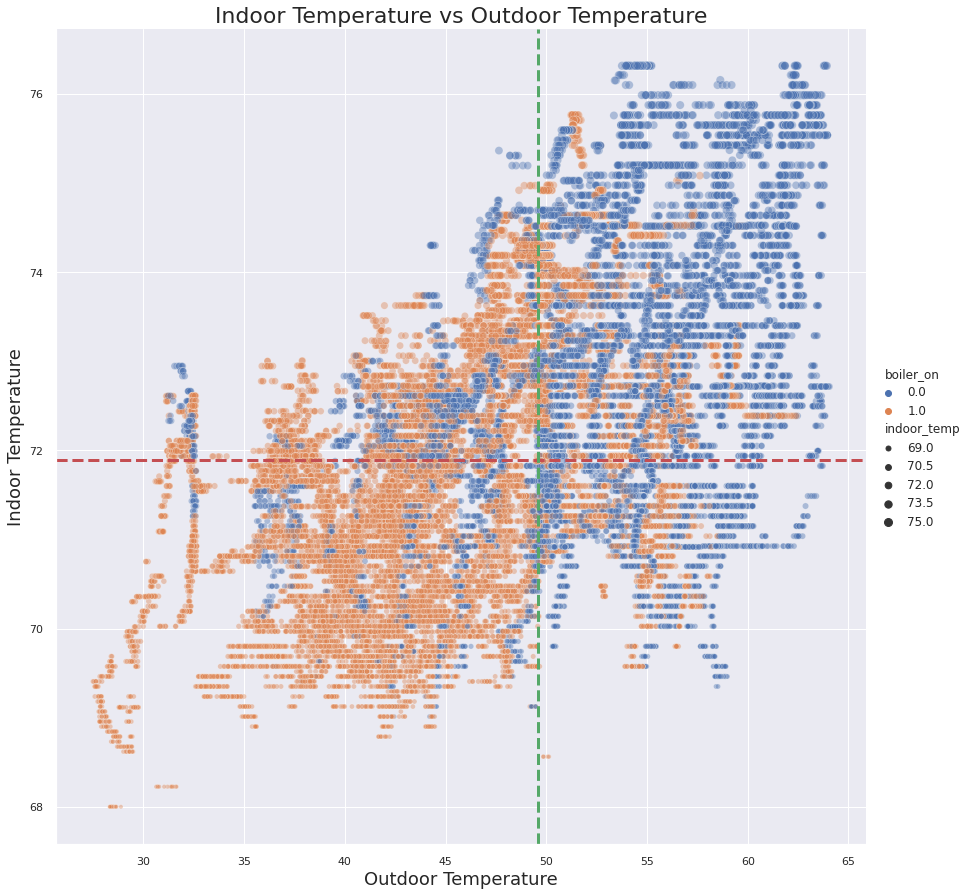

In [40]:
sns.relplot(x='outdoor_temp',
            y='indoor_temp', 
            hue='boiler_on', 
            # col='boiler_on', 
            data=ts, 
            alpha=0.4,
            height=12,
            size='indoor_temp')
plt.axhline(mean, color='r',label= 'Mean: '+str(mean)+' °F', linewidth=3, linestyle='--')
plt.axvline(mode, color='g',label= 'Mode: '+str(mode)+' °F', linewidth=3, linestyle='--')
plt.title('Indoor Temperature vs Outdoor Temperature', fontsize=22)
plt.xlabel('Outdoor Temperature', fontsize=18)
plt.ylabel('Indoor Temperature', fontsize=18)
plt.show();

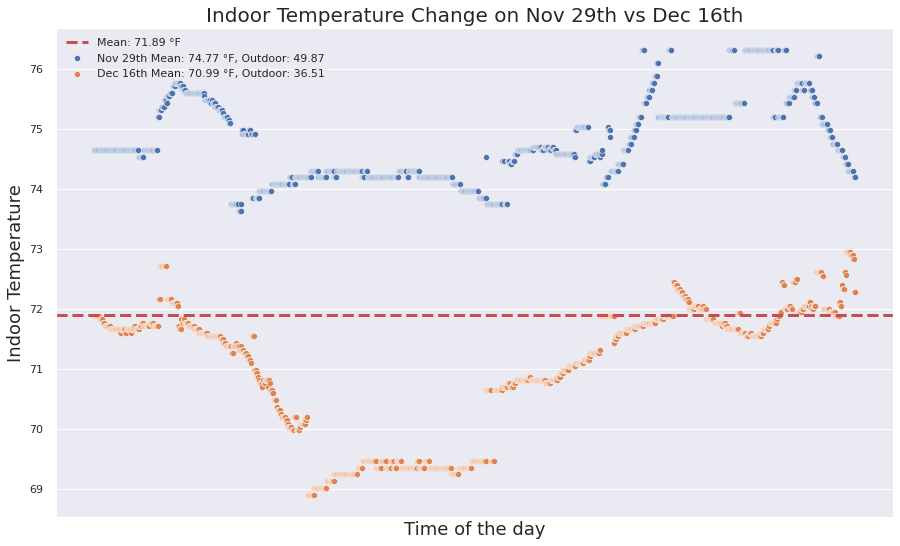

In [41]:
# Check how the indoor temperature is changing during the day.
# Select two different dates for comparison.

mean = round(ts['indoor_temp'].mean(), 2)
mean_29th = round(ts['2020-11-29']['indoor_temp'].mean(),2)
mode_29th = round(statistics.mode(ts['2020-11-29']['outdoor_temp']),2)
mean_16th = round(ts['2020-12-16']['indoor_temp'].mean(),2)
mode_16th = round(statistics.mode(ts['2020-12-16']['outdoor_temp']),2)

x_axis = list(range(len(ts['2020-12-16'])))
# x_axis = pd.to_timedelta(np.arange(1440), unit='T')
plt.figure(figsize=(15,9))

sns.scatterplot(x = x_axis, y='indoor_temp', 
                data=ts['2020-11-29'], 
                label='Nov 29th Mean: '+str(mean_29th)+' °F, Outdoor: '+str(mode_29th))
sns.scatterplot(x = x_axis, y='indoor_temp', 
                data=ts['2020-12-16'], 
                label='Dec 16th Mean: '+str(mean_16th)+' °F, Outdoor: '+str(mode_16th))
plt.title('Indoor Temperature Change on Nov 29th vs Dec 16th', fontsize=20)
plt.axhline(mean, color='r', label='Mean: '+str(mean)+' °F', linewidth=3, linestyle='--')
plt.xlabel('Time of the day', fontsize=18)
plt.ylabel('Indoor Temperature', fontsize=18)
plt.xticks([])
plt.legend()
plt.show();

In [42]:
fig = px.scatter(ts['2020-11-29'], x=ts['2020-11-29'].index, 
                 y='indoor_temp', 
                 color='boiler_on',
                 title='Indoor Temperature Regarding Boiler Setting Change on November 29th')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [43]:
fig = px.scatter(ts['2020-11-29'], x=ts['2020-11-29'].index, 
                 y='outdoor_temp', 
                 color='boiler_on',
                 title='Outdoor Temperature vs Boiler Setting Change on November 29th')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [44]:
fig = px.scatter(ts['2020-12-16'], x=ts['2020-12-16'].index, 
                 y='indoor_temp', 
                 color='boiler_on',
                 title='Indoor Temperature Regarding Boiler Setting Change on December 16th')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [45]:
fig = px.scatter(ts['2020-12-16'], x=ts['2020-12-16'].index, 
                 y='outdoor_temp', 
                 color='boiler_on',
                 title='Outdoor Temperature vs Boiler Setting Change on December 16th')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [46]:
print('The Mode of Outdoor Temperature on November 29th :', mode_29th)
print('Boiler Setting Value Counts on November 29th     :')
print(ts['2020-11-29']['boiler_on'].value_counts(),'\n\n')

print('The Mode of Outdoor Temperature on December 16th :', mode_16th)
print('Boiler Setting Value Counts on Decemper 16th     :')
print(ts['2020-12-16']['boiler_on'].value_counts())

The Mode of Outdoor Temperature on November 29th : 49.87
Boiler Setting Value Counts on November 29th     :
1.0    726
0.0    714
Name: boiler_on, dtype: int64 


The Mode of Outdoor Temperature on December 16th : 36.51
Boiler Setting Value Counts on Decemper 16th     :
1.0    1253
0.0     187
Name: boiler_on, dtype: int64


### Observations

* Indoor temperature changes depending on the ourdoor temperature, time of the day, and boiler on/off setting.

* Heatmap shows there is no high correlation between variables except temperature difference column which was engineered by subtracting outdoor temperature from indoor temperature. Indoor temperature and outdoor temperature has a positie correlation of 0.53. Outdoor and indoor temperatures have negative correlations with boiler_on column. This explains that the boiler goes off when the indoor temperature and outdoor temperature get high and vice versa. 

* When the temperature difference is high, boiler is more likely to be on and vice versa.

* The majority of the time when the boiler is on, we observe that indoor temperature is below average indoor temperature. This indicates when the temperature is higher than a certain temperature, the boiler goes off and when the temperature is below a certan temperature, it turns on to reach the optimal temperature.

* When the outdoor temperature is above mode (48.58 °F), the thermostat goes off. We observe when it is above 55°F, it is more likely to go off. When outdoor temperature is below mode and and indoor temperature is below average, the boiler most likely goes on.

* When comparing 2 different days with the same number of temperature snapshots, we observe different optimal temperatures for each day. Such as for our building, average indoor temperature is 71.89 °F. On November 29th, the average indoor temperature is 74.77 °F while the mode outdoor temperature is 49.87 °F. On December 16th, the average indoor temperature is 70.99 °F while the mode outdoor temperature is 36.51 °F. 

* We see similarity in temperature flactuations on each day around same time of the day.

* Given the different outdoor temperatures, boiler settings change for each day. When it is colder, boiler stays on more often to keep the optimal indoor temperature.

--------------------------------------------------------------------------------

## OBJECTIVE 5

***Check the indoor_temp column for stationarity, trends, and seasonality.***

In [47]:
# Create a time series with indoor_temp column
ts_temp = ts.drop(['outdoor_temp', 'boiler_on', 'temp_diff'], axis=1)
ts_temp.head()

,indoor_temp
ts,
2020-11-17 20:24:00,73.7375
2020-11-17 20:25:00,73.7375
2020-11-17 20:26:00,73.7375
2020-11-17 20:27:00,73.7375
2020-11-17 20:28:00,73.7375


### Rolling Statistics

In [48]:
def stationarity_check(ts):
    """
    Function to check stationarity using Rolling statistics and Dickey-Fuller Test.

    Args:
        ts - A pandas time series dataframe
    
     Returns:
         - Rolling statistics plot
    """
            
    # Calculate rolling statistics
    roll_mean = ts.rolling(window=8, center=False).mean()
    roll_std = ts.rolling(window=8, center=False).std()

    
    # Plot rolling statistics:
    fig = plt.figure(figsize=(12,6))
    orig = plt.plot(ts, color='blue',label='Original')
    mean = plt.plot(roll_mean, color='red', label='Rolling Mean')
    std = plt.plot(roll_std, color='green', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)

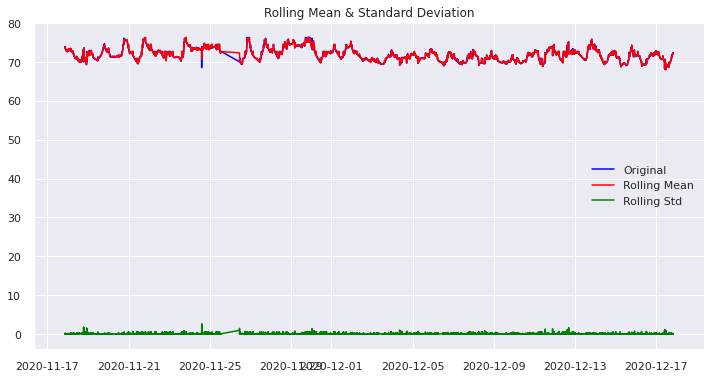

In [49]:
stationarity_check(ts_temp)

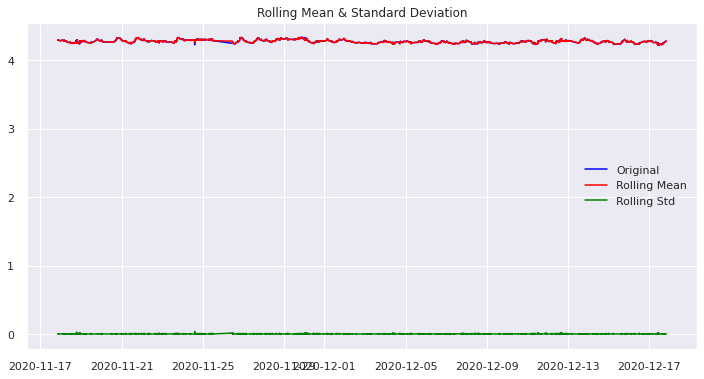

In [50]:
stationarity_check(np.log(ts_temp))

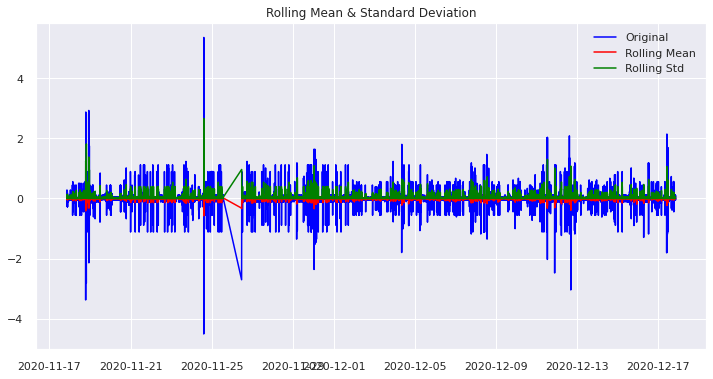

In [51]:
stationarity_check(ts_temp.diff(periods=1).dropna())

### Dickey-Fuller Test

In [52]:
def dickey_fuller_test(ts):
    """
    Function to check stationarity using Dickey-Fuller Test.

    Args:
        ts - A pandas time series dataframe
    
     Returns:
         - Dickey-Fuller test results
    """

    # Perform the Dickey Fuller test
    dftest = adfuller(ts) 
    
    # Print Dickey-Fuller test results

    print('\nResults of Dickey-Fuller Test: \n')

    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', 
                                             '#Lags Used', 'Number of Observations Used'])
    for key, value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(round(dfoutput,3))


In [53]:
dickey_fuller_test(ts_temp['indoor_temp'])


Results of Dickey-Fuller Test: 

Test Statistic                    -5.923
p-value                            0.000
#Lags Used                        53.000
Number of Observations Used    41844.000
Critical Value (1%)               -3.431
Critical Value (5%)               -2.862
Critical Value (10%)              -2.567
dtype: float64


The Null Hypothesis for the Dickey-Fuller Test is **that the time series is not stationary**. 

If the test statistic is less than critical value (**-5.923**), we reject the Null Hypothesis and say the series is **stationary**. We observe that our critical values chage between **-2.567** and **-3.431**, that confirms test statistic is less than critical value. And the p-value of time series is lower than 0.05. In this circumstances, we reject the Null Hypothesis.

Based on our observations, we can confirm that the times series is stationary.

### Decomposition

In [54]:
def decomposition_plot(ts):

    """
    Function to apply decomposition using seasonal_decomposition.

    Args:
        ts - A pandas time series dataframe.
        Function takes in ts but uses log transformed ts for decomposition.
    
     Returns:
         Plots for original data, trends, seasonality and residuals.
    """
# Apply seasonal_decompose 
    decomposition = seasonal_decompose(ts, freq=3600)
    
# Get trend, seasonality, and residuals
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid

# Plotting
    plt.figure(figsize=(12,8))
    plt.subplot(411)
    plt.plot(ts, label='Original', color='blue')
    plt.legend(loc='best')
    plt.subplot(412)
    plt.plot(trend, label='Trend', color='blue')
    plt.legend(loc='best')
    plt.subplot(413)
    plt.plot(seasonal,label='Seasonality', color='blue')
    plt.legend(loc='best')
    plt.subplot(414)
    plt.plot(residual, label='Residuals', color='blue')
    plt.legend(loc='best')
    plt.tight_layout()


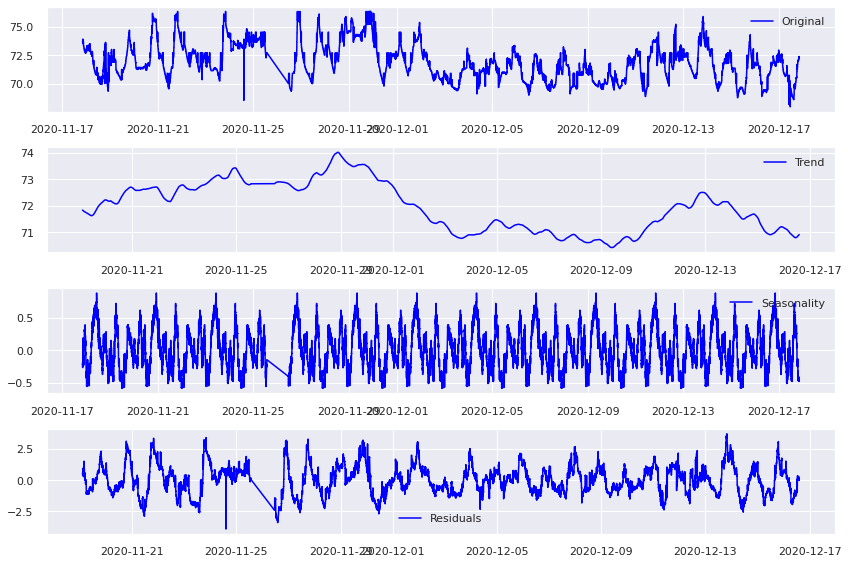

In [55]:
decomposition_plot(ts_temp)

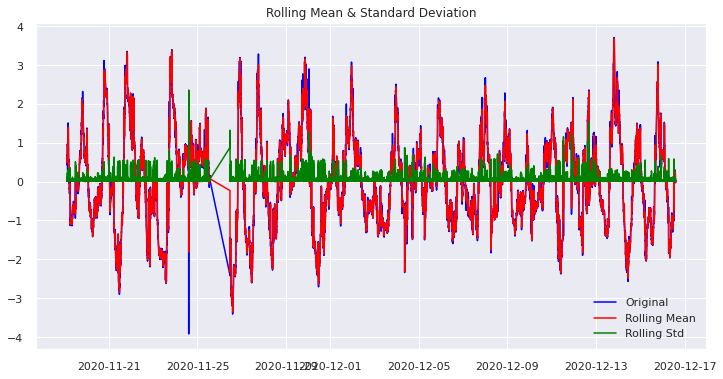

In [56]:
# Check stationarity of the residuals.
decomposition = seasonal_decompose(ts_temp, freq=3600)
stationarity_check(decomposition.resid.dropna())

### ACF and PACF Plots

In [57]:
def plot_acf_pacf(ts, figsize=(10,8),lags=24):
    """
    Function to visualize autocorrelation and partial autocorrelation plots.

    Args:
        ts - A pandas time series dataframe.
        lags - Number of lags, default is 24.
    
     Returns:
         Plots for ACF and PACF.
    """
    
    fig,ax = plt.subplots(nrows=3, figsize=figsize)
    
    # Plot ts
    ts.plot(ax=ax[0])
    
    # Plot acf, pavf
    plot_acf(ts, ax=ax[1], lags=lags)
    plot_pacf(ts, ax=ax[2], lags=lags) 
    fig.tight_layout()
    
    for a in ax[1:]:
        a.xaxis.set_major_locator(mpl.ticker.MaxNLocator(min_n_ticks=lags, integer=True))
        a.xaxis.grid()
    return fig,ax

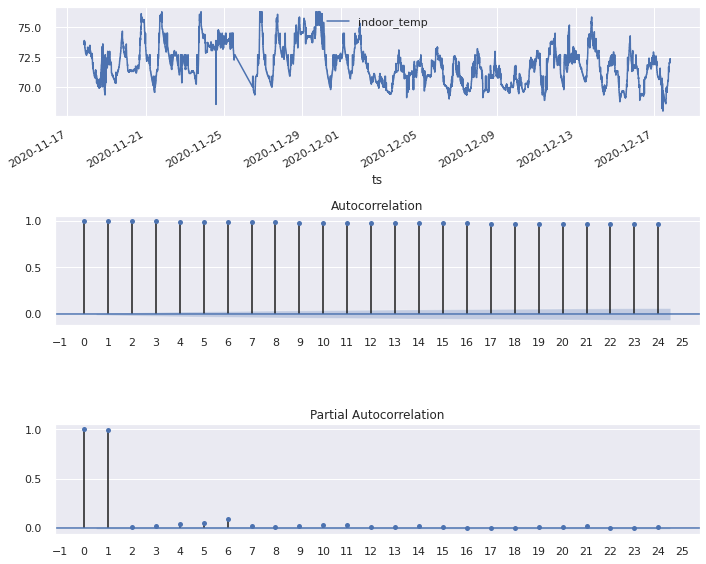

In [58]:
plot_acf_pacf(ts_temp);

### Observations

*   A time series is stationary if the mean and variance remain constant over time. We apply Rolling Statistics test and observe that indoor temperature goes up and down with no clear direction ans standard deviation oscialates around 0.(0 and above) We apply log transformation to remove seasonality.
*   The Null Hypothesis for the Dickey-Fuller Test is **that the time series is not stationary**. Our p=value is lower than 0.05 and test statistic is less than critical values. We refect the Null Hypothesis.
*   Decomposition shows trend, seasonality, and residuals. Residuls are the data that the trend ans seasonality removed. With stationarity_check, we confirm that it is stationary.
*   ACF and PACF plots confirm stationarity.

# SAVE DATA

We save both datasets for modeling. 

In [59]:
df

,building_id,ts,outdoor_temp,boiler_on,indoor_temp,temp_diff
0,6294,2020-11-17 20:24:00,46.748,0.0,76.6015,29.8535
1,6294,2020-11-17 20:25:00,46.798,0.0,76.6015,29.8035
2,6294,2020-11-17 20:26:00,46.810,0.0,76.6015,29.7915
3,6294,2020-11-17 20:27:00,46.636,0.0,76.6015,29.9655
4,6294,2020-11-17 20:28:00,46.224,0.0,76.6015,30.3775
...,...,...,...,...,...,...
3524910,4822071968685,2020-12-17 20:18:00,31.429,0.0,75.0200,43.5910
3524911,4822071968685,2020-12-17 20:19:00,30.984,0.0,75.0200,44.0360
3524912,4822071968685,2020-12-17 20:20:00,31.017,0.0,75.0200,44.0030
3524913,4822071968685,2020-12-17 20:21:00,30.967,0.0,75.0200,44.0530


In [60]:
print('There are {} data points in the datarame before the duplicates are dropped.'.format(len(df)))
print('There are {} duplicate rows in the data.'.format(df.duplicated(subset=['ts', 'building_id', 'boiler_on', 'indoor_temp']).sum()))
df.drop_duplicates(subset=['ts','building_id', 'boiler_on', 'indoor_temp'], inplace=True)
print('There are {} data points left in the datarame after the duplicates are dropped.'.format(len(df)))

There are 3147434 data points in the datarame before the duplicates are dropped.
There are 7374 duplicate rows in the data.
There are 3140060 data points left in the datarame after the duplicates are dropped.


In [62]:
df.to_csv('/content/thermostat_modeling_data.csv')

In [63]:
data.to_csv('/content/thermostat_single_building_data.csv')